This notebook is used for using [cell2location](https://doi.org/10.1038/s41587-021-01139-4) tool to integrate scRNAseq data with ST data. It follows the tutorial given for the tool on [this page](https://cell2location.readthedocs.io/en/latest/notebooks/cell2location_tutorial.html), as well as some additional QC steps.

This script uses 9 major cell types with absolute threshold idea for spot annotation.

## Initialisation of packages and paths

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import squidpy as sq
from scipy.sparse import csr_matrix
import anndata as ad
import os
import seaborn as sns
from sklearn.metrics import confusion_matrix

import cell2location
from cell2location.utils.filtering import filter_genes
from cell2location.models import RegressionModel
from cell2location import run_colocation
from cell2location.utils import select_slide

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text for PDFs

/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
results_folder = '/disk2/user/hilpek/project_root/cell2location/outputs/cell2loc3_1'

# create paths and names to results folders for reference regression and cell2location models
ref_run_name = f'{results_folder}/reference_signatures'
run_name = f'{results_folder}/cell2location_map'

## Reading ST Visium data

In [3]:
adata_vis = sq.read.visium("/disk3/cda/SpatialTranscriptomics/processed-data/SpaceRanger-output_v1.0.0-rerun2023/V10F03-034_C/outs",
        counts_file='filtered_feature_bc_matrix.h5', 
        source_image_path="/disk3/cda/SpatialTranscriptomics/raw-data/High-resolution_tissue_images/V10F03-034/210223_BC_S7_V10F03-034_RJ.C1-Spot000001.jpg"
    )

/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
adata_vis

AnnData object with n_obs × n_vars = 2061 × 36601
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [5]:
adata_vis.uns

OrderedDict([('spatial',
              {'V10F03-034_C': {'metadata': {'chemistry_description': "Spatial 3' v1",
                 'software_version': 'spaceranger-1.0.0',
                 'source_image_path': '/disk3/cda/SpatialTranscriptomics/raw-data/High-resolution_tissue_images/V10F03-034/210223_BC_S7_V10F03-034_RJ.C1-Spot000001.jpg'},
                'images': {'hires': array([[[255, 255, 255],
                         [255, 255, 255],
                         [255, 255, 255],
                         ...,
                         [255, 255, 255],
                         [255, 255, 255],
                         [255, 255, 255]],
                 
                        [[255, 255, 255],
                         [255, 255, 255],
                         [255, 255, 255],
                         ...,
                         [255, 255, 255],
                         [255, 255, 255],
                         [255, 255, 255]],
                 
                        [[255, 255, 25

In [6]:
adata_vis.obsm

AxisArrays with keys: spatial

### Prepare adata_vis.obs

In [7]:
# get the sample id for each spot
adata_vis.obs['sample'] = list(adata_vis.uns['spatial'].keys())[0]

In [8]:
# add pathologist annotations
annoDf = pd.read_csv("/disk3/cda/SpatialTranscriptomics/pathologist_annotations/Tissue-annotations_pathologist-2-and-3_CSVs/V10F03-034_C_S7_Wenwen-annotations.csv")

# replace empty annotations with "Mixed"
annoDf.fillna('Mixed', inplace=True)
annoArray = annoDf["Wenwen annotations"].to_numpy()
adata_vis.obs["Pathologist_annotations"] = pd.Categorical(annoArray)

In [9]:
# add sample name to obs names, important for looking at individual slides later
adata_vis.obs["sample"] = [str(i) for i in adata_vis.obs['sample']]
adata_vis.obs_names = adata_vis.obs["sample"] + '_' + adata_vis.obs_names
adata_vis.obs.index.name = 'spot_id'

adata_vis.obs

,in_tissue,array_row,array_col,sample,Pathologist_annotations
spot_id,,,,,
V10F03-034_C_AAACACCAATAACTGC-1,1,59,19,V10F03-034_C,Tumor
V10F03-034_C_AAACAGCTTTCAGAAG-1,1,43,9,V10F03-034_C,Tumor
V10F03-034_C_AAACAGGGTCTATATT-1,1,47,13,V10F03-034_C,Mixed
V10F03-034_C_AAACAGTGTTCCTGGG-1,1,73,43,V10F03-034_C,Tumor
V10F03-034_C_AAACATGGTGAGAGGA-1,1,62,0,V10F03-034_C,Tumor
...,...,...,...,...,...
V10F03-034_C_TTGTTGTGTGTCAAGA-1,1,31,77,V10F03-034_C,Tumor
V10F03-034_C_TTGTTTCACATCCAGG-1,1,58,42,V10F03-034_C,Tumor
V10F03-034_C_TTGTTTCATTAGTCTA-1,1,60,30,V10F03-034_C,Mixed


In [10]:
adata_vis.obs["Pathologist_annotations"].value_counts()

Pathologist_annotations
Tumor            1209
Mixed             565
Stroma            213
Immune cells       57
Benign breast      17
Name: count, dtype: int64

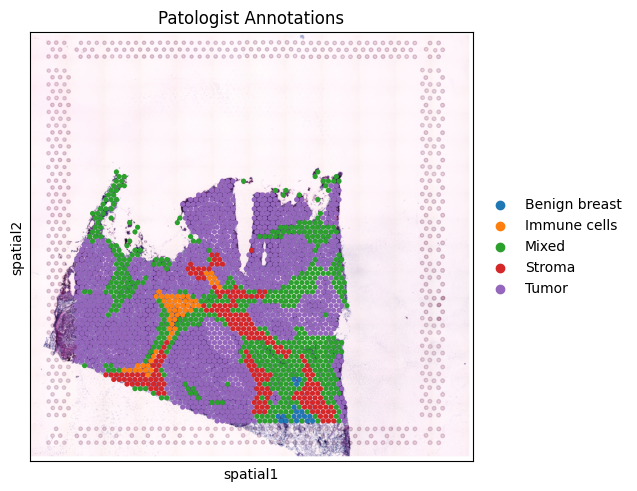

In [11]:
sq.pl.spatial_scatter(
    adata_vis,
    color="Pathologist_annotations",
    title="Patologist Annotations",
    size=1.5
)

### Prepare adata_vis.var

In [12]:
adata_vis.var['SYMBOL'] = adata_vis.var_names
adata_vis.var.set_index('gene_ids', drop=True, inplace=True)
adata_vis.var

,feature_types,genome,SYMBOL
gene_ids,,,
ENSG00000243485,Gene Expression,GRCh38,MIR1302-2HG
ENSG00000237613,Gene Expression,GRCh38,FAM138A
ENSG00000186092,Gene Expression,GRCh38,OR4F5
ENSG00000238009,Gene Expression,GRCh38,AL627309.1
ENSG00000239945,Gene Expression,GRCh38,AL627309.3
...,...,...,...
ENSG00000277836,Gene Expression,GRCh38,AC141272.1
ENSG00000278633,Gene Expression,GRCh38,AC023491.2
ENSG00000276017,Gene Expression,GRCh38,AC007325.1


In [13]:
# calculate QC metrics
if not isinstance(adata_vis.X, np.ndarray):
    adata_vis.X = adata_vis.X.toarray()
    
adata_vis.var['mt'] = adata_vis.var["SYMBOL"].str.startswith(("mt-", "MT-"))
adata_vis.var["ribo"] = adata_vis.var["SYMBOL"].str.startswith(("RPS", "RPL"))

sc.pp.calculate_qc_metrics(adata_vis, qc_vars=['mt', 'ribo'], percent_top=None, log1p=False, inplace=True)

adata_vis.X = csr_matrix(adata_vis.X)
adata_vis.X

<2061x36601 sparse matrix of type '<class 'numpy.float32'>'
	with 1532651 stored elements in Compressed Sparse Row format>

In [14]:
adata_vis.obs

,in_tissue,array_row,array_col,sample,Pathologist_annotations,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
spot_id,,,,,,,,,,,
V10F03-034_C_AAACACCAATAACTGC-1,1,59,19,V10F03-034_C,Tumor,447,562.0,11.0,1.957295,56.0,9.964413
V10F03-034_C_AAACAGCTTTCAGAAG-1,1,43,9,V10F03-034_C,Tumor,711,980.0,22.0,2.244898,140.0,14.285715
V10F03-034_C_AAACAGGGTCTATATT-1,1,47,13,V10F03-034_C,Mixed,754,939.0,18.0,1.916933,92.0,9.797657
V10F03-034_C_AAACAGTGTTCCTGGG-1,1,73,43,V10F03-034_C,Tumor,306,352.0,17.0,4.829545,34.0,9.659091
V10F03-034_C_AAACATGGTGAGAGGA-1,1,62,0,V10F03-034_C,Tumor,1229,1770.0,19.0,1.073446,170.0,9.604520
...,...,...,...,...,...,...,...,...,...,...,...
V10F03-034_C_TTGTTGTGTGTCAAGA-1,1,31,77,V10F03-034_C,Tumor,338,383.0,12.0,3.133159,31.0,8.093995
V10F03-034_C_TTGTTTCACATCCAGG-1,1,58,42,V10F03-034_C,Tumor,351,417.0,24.0,5.755396,61.0,14.628297
V10F03-034_C_TTGTTTCATTAGTCTA-1,1,60,30,V10F03-034_C,Mixed,1208,2311.0,34.0,1.471225,221.0,9.562960


In [15]:
# check the presence of mitochondrial genes
adata_vis.var[adata_vis.var["mt"]==True]

,feature_types,genome,SYMBOL,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
gene_ids,,,,,,,,,
ENSG00000198888,Gene Expression,GRCh38,MT-ND1,True,False,1643,2.918971,20.281417,6016.0
ENSG00000198763,Gene Expression,GRCh38,MT-ND2,True,False,1083,1.051431,47.452693,2167.0
ENSG00000198804,Gene Expression,GRCh38,MT-CO1,True,False,1859,5.473071,9.801067,11280.0
ENSG00000198712,Gene Expression,GRCh38,MT-CO2,True,False,1804,4.626395,12.469675,9535.0
ENSG00000228253,Gene Expression,GRCh38,MT-ATP8,True,False,75,0.037361,96.360990,77.0
ENSG00000198899,Gene Expression,GRCh38,MT-ATP6,True,False,1618,2.763707,21.494420,5696.0
ENSG00000198938,Gene Expression,GRCh38,MT-CO3,True,False,1955,7.518680,5.143134,15496.0
ENSG00000198840,Gene Expression,GRCh38,MT-ND3,True,False,1515,2.495391,26.491994,5143.0
ENSG00000212907,Gene Expression,GRCh38,MT-ND4L,True,False,136,0.076177,93.401262,157.0


In [16]:
# check the presence of ribosomal genes
adata_vis.var[adata_vis.var["ribo"]==True]

,feature_types,genome,SYMBOL,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
gene_ids,,,,,,,,,
ENSG00000116251,Gene Expression,GRCh38,RPL22,False,True,1253,1.379913,39.204270,2844.0
ENSG00000142676,Gene Expression,GRCh38,RPL11,False,True,1554,2.149927,24.599709,4431.0
ENSG00000117676,Gene Expression,GRCh38,RPS6KA1,False,True,103,0.051431,95.002426,106.0
ENSG00000142937,Gene Expression,GRCh38,RPS8,False,True,1608,2.542455,21.979622,5240.0
ENSG00000122406,Gene Expression,GRCh38,RPL5,False,True,1313,1.384765,36.293062,2854.0
...,...,...,...,...,...,...,...,...,...
ENSG00000241343,Gene Expression,GRCh38,RPL36A,False,True,1294,1.542940,37.214944,3180.0
ENSG00000198918,Gene Expression,GRCh38,RPL39,False,True,1376,1.702572,33.236293,3509.0
ENSG00000147403,Gene Expression,GRCh38,RPL10,False,True,1519,2.293062,26.297914,4726.0


###  Filter mitochondrial and ribosomal genes

In [17]:
# find and remove MT genes for spatial mapping (keeping their counts in the object)
adata_vis.obs['mt_frac'] = adata_vis[:, adata_vis.var['mt'].tolist()].X.sum(1).A.squeeze()/adata_vis.obs['total_counts']
adata_vis.obsm['MT'] = adata_vis[:, adata_vis.var['mt'].values].X.toarray()


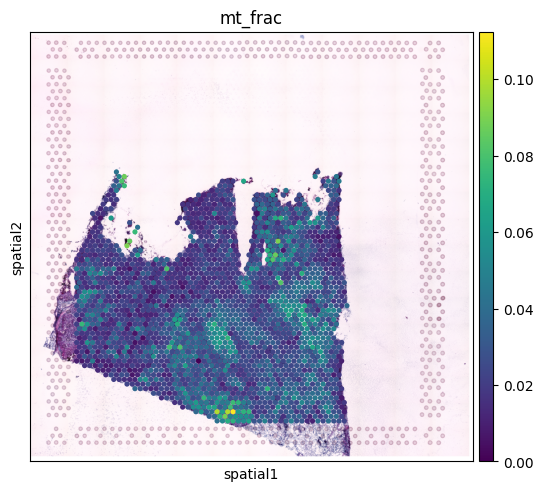

In [18]:
sq.pl.spatial_scatter(adata_vis, color='mt_frac', cmap='viridis', size=1.5)

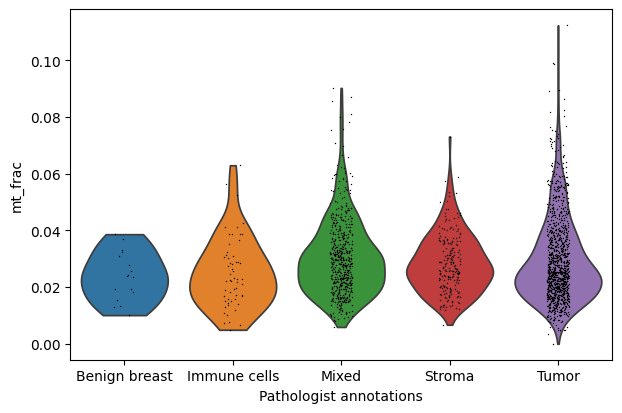

In [19]:
sc.pl.violin(adata_vis, keys='mt_frac', groupby='Pathologist_annotations')

In [20]:
adata_vis = adata_vis[:, ~adata_vis.var['mt'].values]
adata_vis

View of AnnData object with n_obs × n_vars = 2061 × 36588
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'spatial', 'Pathologist_annotations_colors'
    obsm: 'spatial', 'MT'

In [21]:
# find and remove RB genes for spatial mapping (keeping their counts in the objm)
adata_vis.obs['ribo_frac'] = adata_vis[:, adata_vis.var['ribo'].tolist()].X.sum(1).A.squeeze()/adata_vis.obs['total_counts']
adata_vis.obsm['RB'] = adata_vis[:, adata_vis.var['ribo'].values].X.toarray()


/tmp/ipykernel_306001/1201221376.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_vis.obs['ribo_frac'] = adata_vis[:, adata_vis.var['ribo'].tolist()].X.sum(1).A.squeeze()/adata_vis.obs['total_counts']


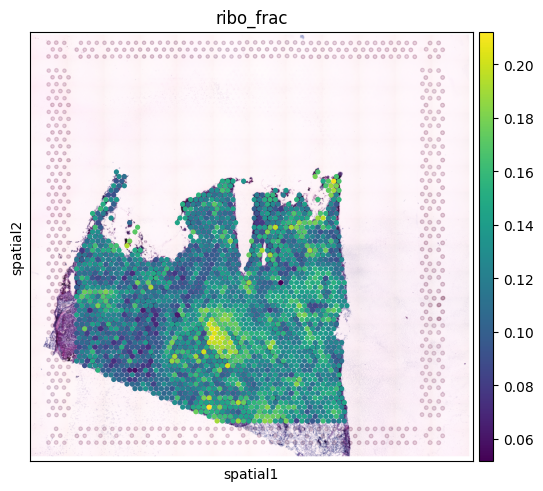

In [22]:
sq.pl.spatial_scatter(adata_vis, color='ribo_frac', cmap='viridis', size=1.5)

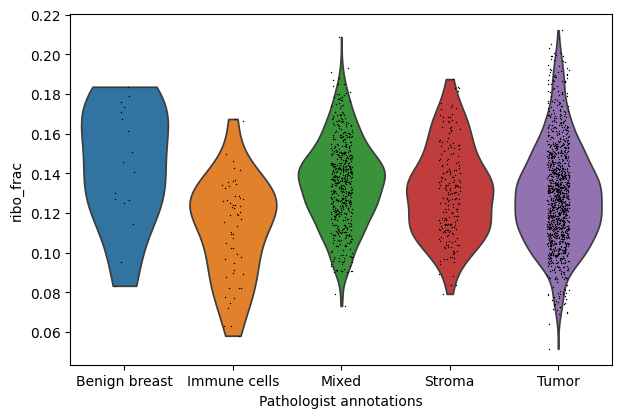

In [23]:
sc.pl.violin(adata_vis, keys='ribo_frac', groupby='Pathologist_annotations')

In [24]:
adata_vis = adata_vis[:, ~adata_vis.var['ribo'].values]
adata_vis

View of AnnData object with n_obs × n_vars = 2061 × 36485
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'spatial', 'Pathologist_annotations_colors'
    obsm: 'spatial', 'MT', 'RB'

### Determine QC thresholds

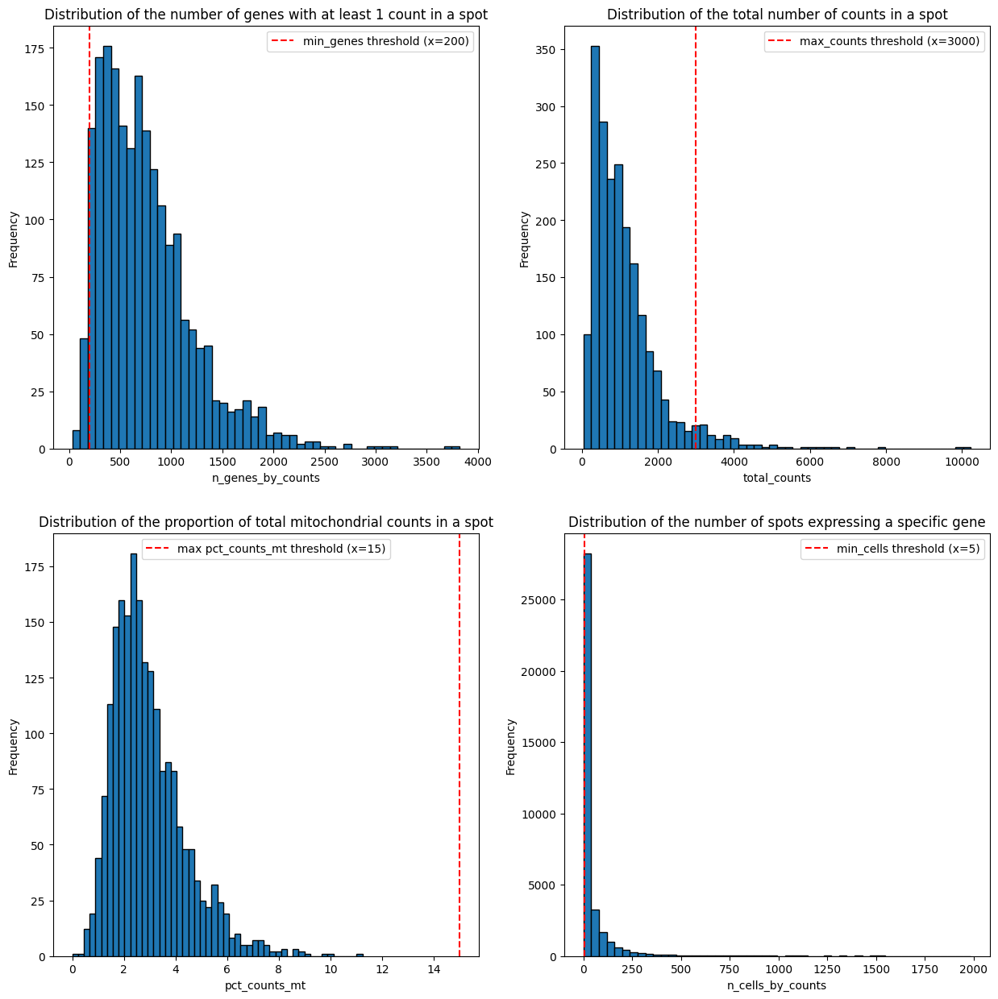

In [25]:
# create 4 subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,15))

# plot n_genes_by_counts for min_genes threshold
axes[0][0].hist(adata_vis.obs['n_genes_by_counts'], bins=50, edgecolor="black")
axes[0][0].set_title('Distribution of the number of genes with at least 1 count in a spot')
axes[0][0].axvline(x=200, color='red', linestyle='--', linewidth=1.5, label='min_genes threshold (x=200)')
axes[0][0].legend()
axes[0][0].set_xlabel('n_genes_by_counts')
axes[0][0].set_ylabel('Frequency')

# plot total_counts for max_counts threshold
axes[0][1].hist(adata_vis.obs['total_counts'], bins=50, edgecolor="black")
axes[0][1].set_title('Distribution of the total number of counts in a spot')
axes[0][1].axvline(x=3000, color='red', linestyle='--', linewidth=1.5, label='max_counts threshold (x=3000)')
axes[0][1].legend()
axes[0][1].set_xlabel('total_counts')
axes[0][1].set_ylabel('Frequency')

# plot pct_counts_mt for pct_counts_mt threshold
axes[1][0].hist(adata_vis.obs['pct_counts_mt'], bins=50, edgecolor="black")
axes[1][0].set_title('Distribution of the proportion of total mitochondrial counts in a spot')
axes[1][0].axvline(x=15, color='red', linestyle='--', linewidth=1.5, label='max pct_counts_mt threshold (x=15)')
axes[1][0].legend()
axes[1][0].set_xlabel('pct_counts_mt')
axes[1][0].set_ylabel('Frequency')

# plot n_cells_by_counts for min_cells threshold
axes[1][1].hist(adata_vis.var['n_cells_by_counts'], bins=50, edgecolor="black")
axes[1][1].set_title('Distribution of the number of spots expressing a specific gene')
axes[1][1].axvline(x=5, color='red', linestyle='--', linewidth=1.5, label='min_cells threshold (x=5)')
axes[1][1].legend()
axes[1][1].set_xlabel('n_cells_by_counts')
axes[1][1].set_ylabel('Frequency')

plt.show()

In [26]:
 # choose appropriate thresholds for ST data
sc.pp.filter_cells(adata_vis, min_genes = 200)
sc.pp.filter_cells(adata_vis, max_counts= 3000)
adata_vis = adata_vis[adata_vis.obs["pct_counts_mt"] < 5]

# filter genes that are only present in a few spots
sc.pp.filter_genes(adata_vis, min_cells=5)
adata_vis

/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:283: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["n_cells"] = number


AnnData object with n_obs × n_vars = 1762 × 14138
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac', 'n_genes', 'n_counts'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'spatial', 'Pathologist_annotations_colors'
    obsm: 'spatial', 'MT', 'RB'

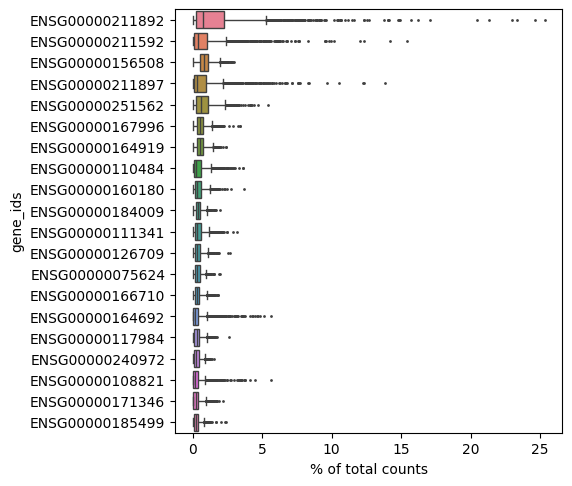

In [27]:
sc.pl.highest_expr_genes(adata_vis, n_top=20, )  # Highest expression genes overall look

### Final structure

In [28]:
adata_vis.var

,feature_types,genome,SYMBOL,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells
gene_ids,,,,,,,,,,
ENSG00000241860,Gene Expression,GRCh38,AL627309.5,False,False,8,0.003882,99.611839,8.0,8
ENSG00000237491,Gene Expression,GRCh38,LINC01409,False,False,25,0.012130,98.786997,25.0,24
ENSG00000228794,Gene Expression,GRCh38,LINC01128,False,False,46,0.022804,97.768074,47.0,40
ENSG00000223764,Gene Expression,GRCh38,LINC02593,False,False,17,0.008248,99.175158,17.0,15
ENSG00000187634,Gene Expression,GRCh38,SAMD11,False,False,21,0.010674,98.981077,22.0,16
...,...,...,...,...,...,...,...,...,...,...
ENSG00000185973,Gene Expression,GRCh38,TMLHE,False,False,20,0.009704,99.029597,20.0,17
ENSG00000124333,Gene Expression,GRCh38,VAMP7,False,False,31,0.015526,98.495876,32.0,29
ENSG00000277400,Gene Expression,GRCh38,AC145212.1,False,False,51,0.024745,97.525473,51.0,44


In [29]:
adata_vis.obs

,in_tissue,array_row,array_col,sample,Pathologist_annotations,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,mt_frac,ribo_frac,n_genes,n_counts
spot_id,,,,,,,,,,,,,,,
V10F03-034_C_AAACACCAATAACTGC-1,1,59,19,V10F03-034_C,Tumor,447,562.0,11.0,1.957295,56.0,9.964413,0.019573,0.099644,411,495.0
V10F03-034_C_AAACAGCTTTCAGAAG-1,1,43,9,V10F03-034_C,Tumor,711,980.0,22.0,2.244898,140.0,14.285715,0.022449,0.142857,644,818.0
V10F03-034_C_AAACAGGGTCTATATT-1,1,47,13,V10F03-034_C,Mixed,754,939.0,18.0,1.916933,92.0,9.797657,0.019169,0.097977,691,829.0
V10F03-034_C_AAACAGTGTTCCTGGG-1,1,73,43,V10F03-034_C,Tumor,306,352.0,17.0,4.829545,34.0,9.659091,0.048295,0.096591,273,301.0
V10F03-034_C_AAACATGGTGAGAGGA-1,1,62,0,V10F03-034_C,Tumor,1229,1770.0,19.0,1.073446,170.0,9.604520,0.010734,0.096045,1157,1581.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V10F03-034_C_TTGTGTTTCCCGAAAG-1,1,51,59,V10F03-034_C,Stroma,721,1269.0,35.0,2.758077,153.0,12.056737,0.027581,0.120567,645,1081.0
V10F03-034_C_TTGTTGTGTGTCAAGA-1,1,31,77,V10F03-034_C,Tumor,338,383.0,12.0,3.133159,31.0,8.093995,0.031332,0.080940,305,340.0
V10F03-034_C_TTGTTTCATTAGTCTA-1,1,60,30,V10F03-034_C,Mixed,1208,2311.0,34.0,1.471225,221.0,9.562960,0.014712,0.095630,1130,2056.0


## Reading scRNAseq Data

In [30]:
adata_ref = ad.read_h5ad('/disk2/user/hilpek/project_root/scRNAseq/input/Wu_all_NT.h5ad')
# Removed HER samples.
adata_ref = adata_ref[(adata_ref.obs['IHC_subtype'] == 'ER+'), :]
# mt and ribo columns have been added to adata.var
adata_ref.var['mt'] = adata_ref.var_names.str.upper().str.startswith('MT-')
adata_ref.var['ribo'] = adata_ref.var_names.str.upper().str.startswith(('RPL', 'RPS'))
adata_ref.var_names_make_unique()
adata_ref

/tmp/ipykernel_306001/834681103.py:5: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata_ref.var['mt'] = adata_ref.var_names.str.upper().str.startswith('MT-')


AnnData object with n_obs × n_vars = 33790 × 29733
    obs: 'Study_id', 'Celltype_subset', 'bc_subtype', 'donor_age', 'treatment_status', 'grade', 'IHC_subtype', 'Dataset'
    var: 'ENSEMBL', 'mt', 'ribo'

### Get major cell types

In [31]:
# load metadata
metadata = pd.read_csv("/disk2/user/hilpek/project_root/scRNAseq/input/metadata.csv", sep=",")
metadata.set_index('Unnamed: 0', inplace=True)
metadata

,orig.ident,nCount_RNA,nFeature_RNA,percent.mito,subtype,celltype_subset,celltype_minor,celltype_major
Unnamed: 0,,,,,,,,
CID3586_AAGACCTCAGCATGAG,CID3586,4581,1689,1.506221,HER2+,Endothelial ACKR1,Endothelial ACKR1,Endothelial
CID3586_AAGGTTCGTAGTACCT,CID3586,1726,779,5.793743,HER2+,Endothelial ACKR1,Endothelial ACKR1,Endothelial
CID3586_ACCAGTAGTTGTGGCC,CID3586,1229,514,1.383238,HER2+,Endothelial ACKR1,Endothelial ACKR1,Endothelial
CID3586_ACCCACTAGATGTCGG,CID3586,1352,609,1.923077,HER2+,Endothelial ACKR1,Endothelial ACKR1,Endothelial
CID3586_ACTGATGGTCAACTGT,CID3586,1711,807,13.325541,HER2+,Endothelial ACKR1,Endothelial ACKR1,Endothelial
...,...,...,...,...,...,...,...,...
CID4398_TCAGGTAGTACTCAAC,CID4398,6189,1251,2.698336,ER+,Myeloid_c0_DC_LAMP3,DCs,Myeloid
CID4398_TCTATTGTCGCCATAA,CID4398,4611,719,3.057905,ER+,Myeloid_c0_DC_LAMP3,DCs,Myeloid
CID4398_TCTTTCCCAGTAAGCG,CID4398,2987,887,3.682625,ER+,Myeloid_c0_DC_LAMP3,DCs,Myeloid


In [32]:
# get corresponding major cell types for each subset of cell type
subset_to_major_dict = {}
for index, row in metadata.iterrows():
    subset = row["celltype_subset"]
    major = row["celltype_major"]
    if subset not in subset_to_major_dict.keys():
        subset_to_major_dict[subset] = major

subset_to_major_dict

{'Endothelial ACKR1': 'Endothelial',
 'Endothelial RGS5': 'Endothelial',
 'Endothelial CXCL12': 'Endothelial',
 'CAFs MSC iCAF-like s1': 'CAFs',
 'CAFs MSC iCAF-like s2': 'CAFs',
 'CAFs Transitioning s3': 'CAFs',
 'CAFs myCAF like s4': 'CAFs',
 'CAFs myCAF like s5': 'CAFs',
 'PVL Differentiated s3': 'PVL',
 'PVL_Immature s2': 'PVL',
 'PVL Immature s1': 'PVL',
 'Endothelial Lymphatic LYVE1': 'Endothelial',
 'B cells Memory': 'B-cells',
 'B cells Naive': 'B-cells',
 'T_cells_c4_CD8+_ZFP36': 'T-cells',
 'T_cells_c6_IFIT1': 'T-cells',
 'T_cells_c5_CD8+_GZMK': 'T-cells',
 'T_cells_c7_CD8+_IFNG': 'T-cells',
 'T_cells_c8_CD8+_LAG3': 'T-cells',
 'T_cells_c0_CD4+_CCR7': 'T-cells',
 'T_cells_c1_CD4+_IL7R': 'T-cells',
 'T_cells_c2_CD4+_T-regs_FOXP3': 'T-cells',
 'T_cells_c3_CD4+_Tfh_CXCL13': 'T-cells',
 'T_cells_c9_NK_cells_AREG': 'T-cells',
 'T_cells_c11_MKI67': 'T-cells',
 'T_cells_c10_NKT_cells_FCGR3A': 'T-cells',
 'Myeloid_c10_Macrophage_1_EGR1': 'Myeloid',
 'Myeloid_c12_Monocyte_1_IL1B': 'My

In [33]:
# save into adata.obs
adata_ref.obs['Celltype_major'] = adata_ref.obs['Celltype_subset'].map(subset_to_major_dict)
adata_ref.obs

,Study_id,Celltype_subset,bc_subtype,donor_age,treatment_status,grade,IHC_subtype,Dataset,Celltype_major
CID3941_AAAGTAGTCCTTGCCA,CID3941,Endothelial ACKR1,IDC,50.0,Naive,2.0,ER+,CID3941,Endothelial
CID3941_ACAGCCGAGCTCTCGG,CID3941,Endothelial ACKR1,IDC,50.0,Naive,2.0,ER+,CID3941,Endothelial
CID3941_ACGCAGCAGGACCACA,CID3941,Endothelial ACKR1,IDC,50.0,Naive,2.0,ER+,CID3941,Endothelial
CID3941_ACGCAGCCAGCTGTAT,CID3941,Endothelial ACKR1,IDC,50.0,Naive,2.0,ER+,CID3941,Endothelial
CID3941_ACTTTCACAGCCTGTG,CID3941,Endothelial ACKR1,IDC,50.0,Naive,2.0,ER+,CID3941,Endothelial
...,...,...,...,...,...,...,...,...,...
CID4535_TAGTGGTCATTGGCGC,CID4535,Mature Luminal,ILC,47.0,Naive,2.0,ER+,CID4535,Normal Epithelial
CID4535_TCTATTGAGCTAGGCA,CID4535,Mature Luminal,ILC,47.0,Naive,2.0,ER+,CID4535,Normal Epithelial
CID4535_TGCTACCAGGTGTGGT,CID4535,Mature Luminal,ILC,47.0,Naive,2.0,ER+,CID4535,Normal Epithelial
CID4535_TGGCCAGAGCCCAACC,CID4535,Mature Luminal,ILC,47.0,Naive,2.0,ER+,CID4535,Normal Epithelial


In [34]:
adata_ref.var

,ENSEMBL,mt,ribo
RP11-34P13.7,ENSGX0000000001,False,False
FO538757.3,ENSGX0000000002,False,False
FO538757.2,ENSGX0000000003,False,False
AP006222.2,ENSGX0000000004,False,False
RP4-669L17.10,ENSGX0000000005,False,False
...,...,...,...
RP11-983C2.3,ENSGX0000010212,False,False
LINC00919,ENSG00000260268,False,False
RP11-589P10.7,ENSGX0000010213,False,False
KRTAP9-2,ENSG00000262573,False,False


In [35]:
adata_ref.obsm

AxisArrays with keys: 

/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


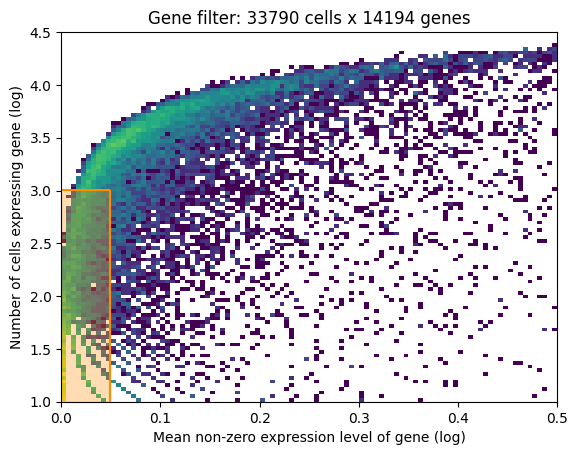

In [36]:
# filter the scRNAseq data 
selected = filter_genes(adata_ref, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
adata_ref = adata_ref[:, selected].copy()

Orange area is the genes excluded based on the combination of number of cells expressing that gene (Y-axis) and average RNA count for cells where the gene was detected (X-axis).

##  Estimation of reference cell type signatures (NB regression)

In [37]:
adata_ref

AnnData object with n_obs × n_vars = 33790 × 14194
    obs: 'Study_id', 'Celltype_subset', 'bc_subtype', 'donor_age', 'treatment_status', 'grade', 'IHC_subtype', 'Dataset', 'Celltype_major'
    var: 'ENSEMBL', 'mt', 'ribo', 'n_cells', 'nonz_mean'

### Train the model

In [38]:
cell2location.models.RegressionModel.setup_anndata(adata=adata_ref,
                        # 10X reaction / sample / batch
                        batch_key='Study_id',
                        # cell type, covariate used for constructing signatures
                        labels_key='Celltype_major'
                       )

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


In [39]:
# create model
mod = RegressionModel(adata_ref)
mod.view_anndata_setup()

Anndata setup with scvi-tools version 1.1.6.post2.

Setup via `RegressionModel.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'Study_id',
│   'labels_key': 'Celltype_major',
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │  10   │
│         n_cells          │ 33790 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   9   │
│          n_vars          │ 14194 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                    batch State Registry                    
┏━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃    Source Location    ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['Study_id'] │  CID3941   │          0          │
│                       │  CID3948   │          1          │
│                       │  CID4040   │          2          │
│                       │  CID4067   │          3          │
│                       │  CID4290A  │          4          │
│                       │  CID4461   │          5          │
│                       │  CID4463   │          6          │
│                       │  CID4471   │          7          │
│                       │  CID4530N  │          8          │
│                       │  CID4535   │          9          │
└───────────────────────┴────────────┴─────────────────────┘

                          labels State Registry                          
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃       Source Location       ┃    Categories     ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['Celltype_major'] │      B-cells      │          0          │
│                             │       CAFs        │          1          │
│                             │ Cancer Epithelial │          2          │
│                             │    Endothelial    │          3          │
│                             │      Myeloid      │          4          │
│                             │ Normal Epithelial │          5          │
│                             │        PVL        │          6          │
│                             │   Plasmablasts    │          7          │
│                             │      T-cells      │          8          │
└─────────────────────────────┴───────────────────┴─────────────────────┘

In [40]:
import torch
print(torch.cuda.is_available())  # True dönerse GPU hazır


True


In [41]:
# train the model
mod.train(max_epochs=400, accelerator='gpu', device=1)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/lightning/pytorch/trainer/configuration_validator.py:68: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Epoch 1/400:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 400/400: 100%|██████████| 400/400 [20:02<00:00,  3.08s/it, v_num=1, elbo_train=2.14e+8]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [20:02<00:00,  3.01s/it, v_num=1, elbo_train=2.14e+8]


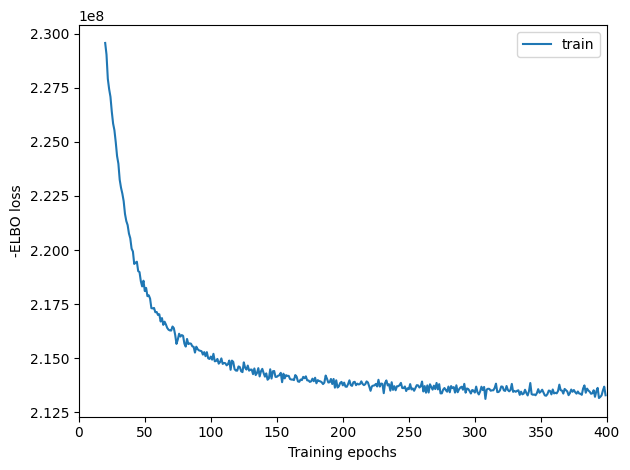

In [42]:
# plot ELBO loss history during training, removing first 20 epochs
mod.plot_history(20)

This plot should have a decreasing trend and level off by the end of training. If it is still decreasing, max_epochs needs to be increased.

### Export results

In [43]:
adata_ref = mod.export_posterior(
    adata_ref, sample_kwargs={'num_samples': 1000, 'batch_size': 2500}
)
# save model
mod.save(f"{ref_run_name}", overwrite=True)

# save anndata object with results
adata_file = f"{ref_run_name}/sc.h5ad"
adata_ref.write(adata_file)
adata_file

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


Sampling global variables, sample: 100%|██████████| 999/999 [00:26<00:00, 37.87it/s]


'/disk2/user/hilpek/project_root/cell2location/outputs/cell2loc3_1/reference_signatures/sc.h5ad'

### Examine QC

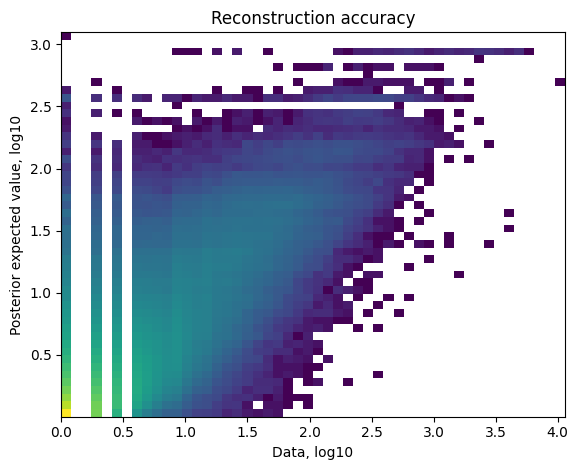

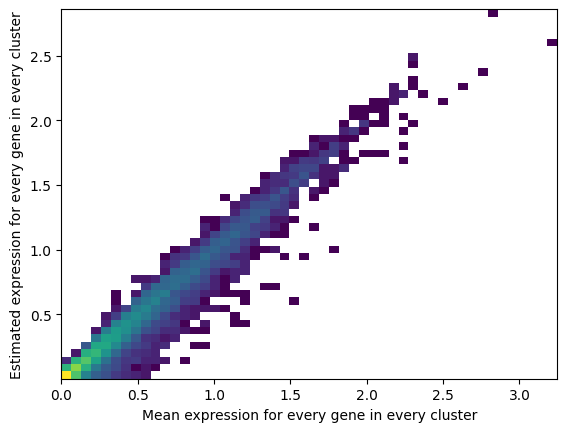

In [44]:
# QC examination
mod.plot_QC()

1.Reconstruction accuracy to assess if there are any issues with inference. This 2D histogram plot should have most observations along a noisy diagonal.


2.The estimated expression signatures are distinct from mean expression in each cluster because of batch effects. For scRNA-seq datasets which do not suffer from batch effect, cluster average expression can be used instead of estimating signatures with a model. When this plot is very different from a diagonal plot (e.g. very low values on Y-axis, density everywhere) it indicates problems with signature estimation.

## Extract reference cell type signatures to Pandas

Note: All parameters of the a Negative Binomial regression model are exported into reference anndata object, however for spatial mapping we just need the estimated expression of every gene in every cell type. Here we extract that from standard output:

In [45]:
if 'means_per_cluster_mu_fg' in adata_ref.varm.keys():
    inf_aver = adata_ref.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_ref.var[[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_ref.uns['mod']['factor_names']
inf_aver.head()

,B-cells,CAFs,Cancer Epithelial,Endothelial,Myeloid,Normal Epithelial,PVL,Plasmablasts,T-cells
FO538757.2,0.024114,0.092674,0.215378,0.118526,0.095532,0.200460,0.071655,0.024366,0.017466
AP006222.2,0.003436,0.064009,0.064280,0.049638,0.040958,0.052926,0.057179,0.004119,0.000899
RP11-206L10.9,0.007974,0.016935,0.071322,0.013768,0.027133,0.043421,0.036955,0.015407,0.004198
SAMD11,0.002991,0.150244,0.004863,0.005553,0.001230,0.004413,0.002917,0.010968,0.000209
NOC2L,0.042675,0.130047,0.607607,0.193065,0.124938,0.524718,0.104753,0.054428,0.035391


In [46]:
import mygene
mg = mygene.MyGeneInfo()

# Get Ensembl IDs
ensembl_ids = adata_vis.var_names.tolist()

# Query gene symbols using mygene
query = mg.querymany(ensembl_ids, scopes='ensembl.gene', fields='symbol', species='human')

# Create a mapping from Ensembl ID to gene symbol (filter out entries with no symbol)
ens_to_symbol = {q['query']: q['symbol'] for q in query if 'symbol' in q and q['symbol'] is not None}

Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed


90 input query terms found no hit:	['ENSG00000271895', 'ENSG00000261135', 'ENSG00000225986', 'ENSG00000273373', 'ENSG00000259834', 'ENS


In [47]:
# Keep only genes that have a matching symbol
valid_genes = [g for g in adata_vis.var_names if g in ens_to_symbol]

# Filter and rename the gene names in the object
adata_vis = adata_vis[:, valid_genes].copy()
adata_vis.var_names = [ens_to_symbol[g] for g in valid_genes]

In [48]:
print("adata_vis.shape (final):", adata_vis.shape)
print("inf_aver.shape (final):", inf_aver.shape)
print("Example gene names:", adata_vis.var_names[:5])

adata_vis.shape (final): (1762, 13722)
inf_aver.shape (final): (14194, 9)
Example gene names: Index(['LINC01409', 'LINC01128', 'LINC02593', 'SAMD11', 'NOC2L'], dtype='object')


##  Cell2location: spatial mapping

In [49]:
# find shared genes and subset both anndata and reference signatures
intersect = np.intersect1d(adata_vis.var_names, inf_aver.index)

adata_vis.var_names_make_unique()


print(f"Common gene counts: {len(intersect)}")


adata_vis = adata_vis[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

# prepare anndata for cell2location model
cell2location.models.Cell2location.setup_anndata(adata=adata_vis, batch_key="sample")

Common gene counts: 11067


### Train the model

**Important:** To use cell2location spatial mapping model, you need to specify 2 user-provided hyperparameters (N_cells_per_location and detection_alpha).

_a) Choosing hyperparameter ``N_cells_per_location``_

It is useful to adapt the expected cell abundance N_cells_per_location to every tissue. This value can be estimated from paired histology images as explained [here](https://github.com/BayraktarLab/cell2location/blob/master/docs/images/Note_on_selecting_hyperparameters.pdf). This parameter can be estimated by manually counting nuclei in a 10-20 locations in the histology image (e.g. using 10X Loupe browser), and computing the average cell abundance.

_b) Choosing hyperparameter ``detection_alpha``_

To improve accuracy & sensitivity on datasets with large technical variability in RNA detection sensitivity within the slide/batch - you need to relax regularisation of per-location normalisation (use detection_alpha=20). High technical variability in RNA detection sensitivity is present in your sample when you observe the spatial distribution of total RNA count per location that doesn’t match expected cell numbers based on histological examination.

In [50]:
# create and train the model
mod = cell2location.models.Cell2location(
    adata_vis, cell_state_df=inf_aver,
    # the expected average cell abundance: tissue-dependent
    # hyper-prior which can be estimated from paired histology:
    N_cells_per_location=40,
    # hyperparameter controlling normalisation of
    # within-experiment variation in RNA detection:
    detection_alpha=5
)
mod.view_anndata_setup()

Anndata setup with scvi-tools version 1.1.6.post2.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'sample',
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   1   │
│         n_cells          │ 1762  │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   1   │
│          n_vars          │ 11067 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                    batch State Registry                    
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃  Categories  ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │ V10F03-034_C │          0          │
└─────────────────────┴──────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

In [51]:
mod.train(max_epochs=40000,
          # train using full data (batch_size=None)
          batch_size=None,
          # use all data points in training because
          # we need to estimate cell abundance at all locations
          train_size=1,
          log_every_n_steps=1,
         )

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/lightning/pytorch/trainer/configuration_validator.py:68: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-pac

Epoch 40000/40000: 100%|██████████| 40000/40000 [2:18:37<00:00,  7.80it/s, v_num=1, elbo_train=3.86e+6]  

`Trainer.fit` stopped: `max_epochs=40000` reached.


Epoch 40000/40000: 100%|██████████| 40000/40000 [2:18:37<00:00,  4.81it/s, v_num=1, elbo_train=3.86e+6]


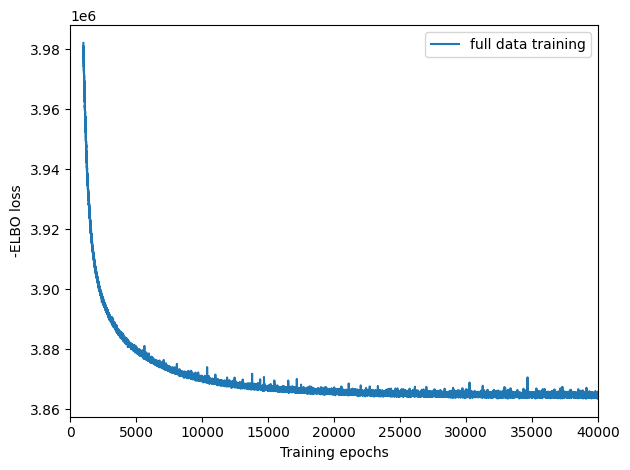

In [52]:
# plot ELBO loss history during training, removing first 100 epochs from the plot
mod.plot_history(1000)
plt.legend(labels=['full data training']);

### Export results

In [53]:
adata_vis = mod.export_posterior(
    adata_vis, sample_kwargs={'num_samples': 1000, 'batch_size': mod.adata.n_obs}
)

# Save model
mod.save(f"{run_name}", overwrite=True)

# Save anndata object with results
adata_file = f"{run_name}/sp.h5ad"
adata_vis.write(adata_file)

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


Sampling global variables, sample: 100%|██████████| 999/999 [00:26<00:00, 37.32it/s]


### Examine QC

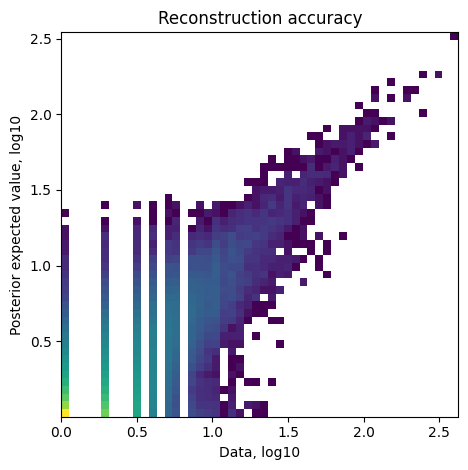

In [54]:
mod.plot_QC()

The plot should be roughly diagonal, strong deviations will signal problems that need to be investigated.

In [55]:
adata_vis

AnnData object with n_obs × n_vars = 1762 × 11067
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac', 'n_genes', 'n_counts', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'spatial', 'Pathologist_annotations_colors', '_scvi_uuid', '_scvi_manager_uuid', 'mod'
    obsm: 'spatial', 'MT', 'RB', 'means_cell_abundance_w_sf', 'stds_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf'

###  Visualising cell abundance in spatial coordinates

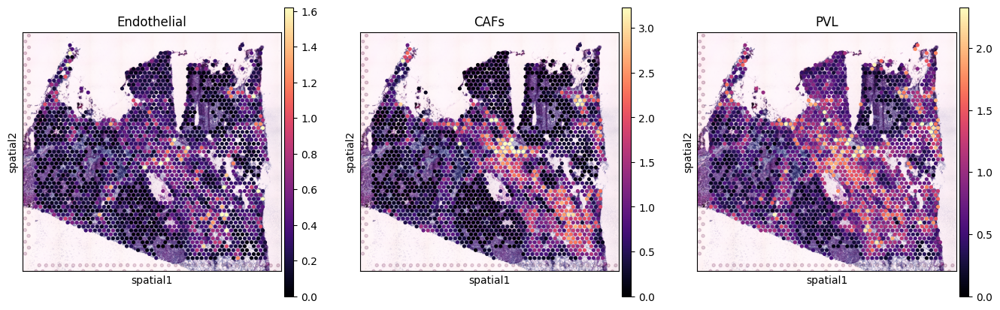

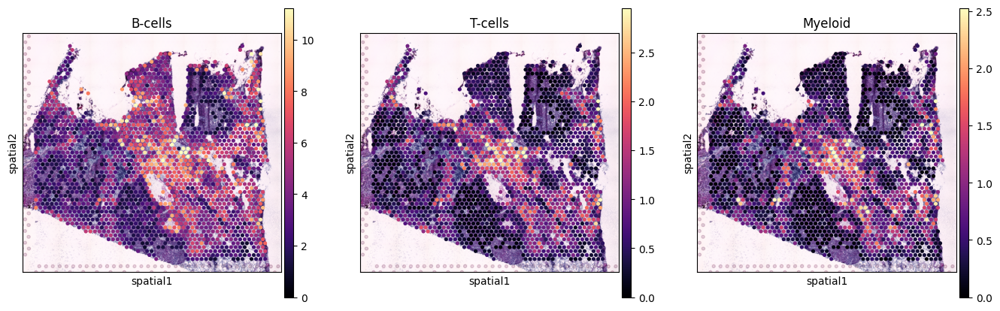

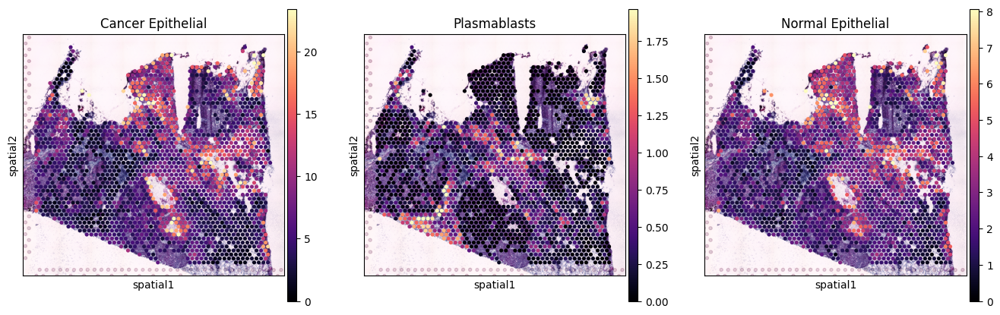

In [56]:
# add 5% quantile, representing confident cell abundance, 'at least this amount is present',
# to adata.obs with nice names for plotting
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf']

# visualise all cell types
slide = select_slide(adata_vis, 'V10F03-034_C')

cell_types = list(adata_ref.obs["Celltype_major"].unique())
for i in range(0, len(cell_types), 3):
    with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):
        sc.pl.spatial(slide, cmap='magma',
                      # show first 8 cell types
                      color=cell_types[i:i+3],
                      ncols=4, size=1.3,
                      img_key='hires',
                      # limit color scale at 99.2% quantile of cell abundance
                      vmin=0, vmax='p99.2'
                     )

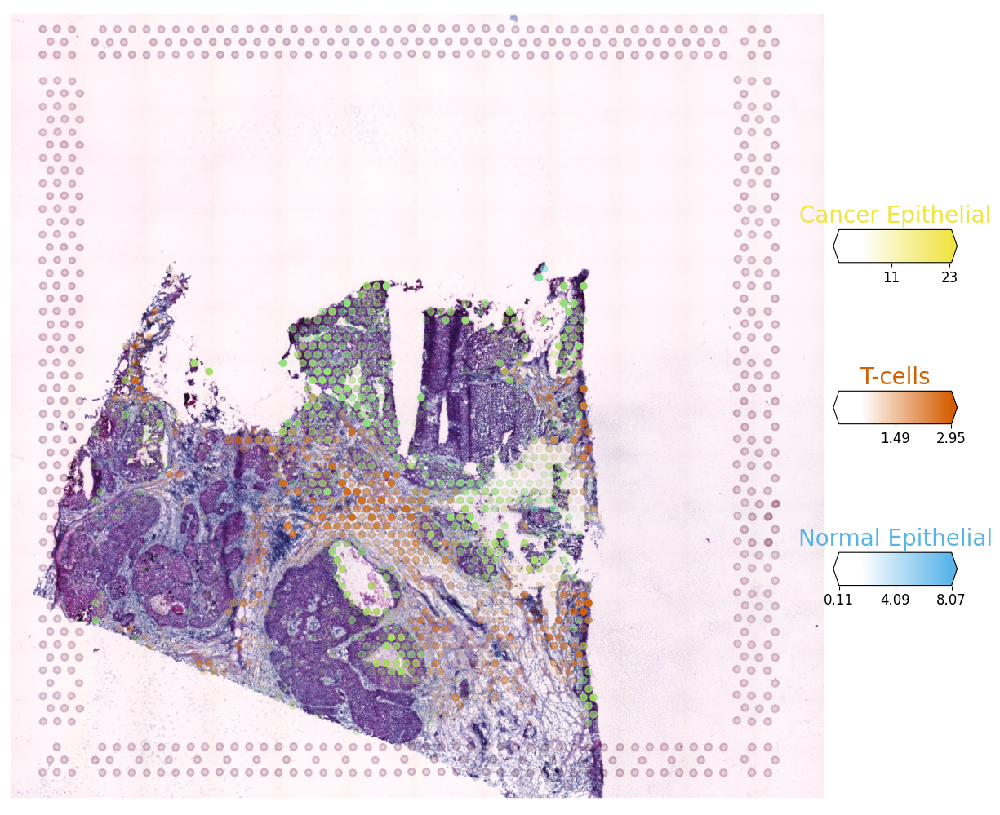

In [57]:
# Now we use cell2location plotter that allows showing multiple cell types in one panel
from cell2location.plt import plot_spatial

# select up to 6 clusters
clust_labels = ['Cancer Epithelial', 'T-cells', 'Normal Epithelial']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

slide = select_slide(adata_vis, 'V10F03-034_C')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        colorbar_position='right'
    )

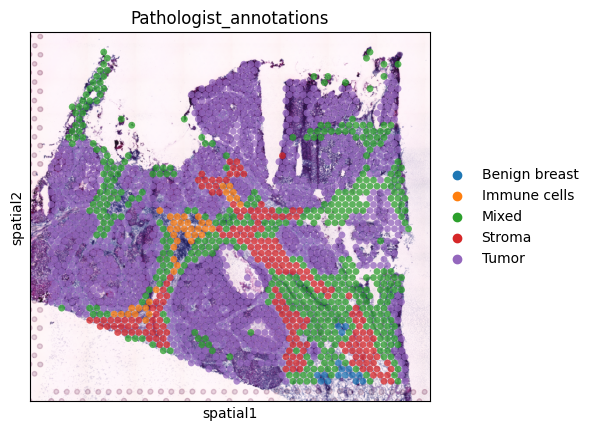

In [58]:
# pathologist annotation of the used sample
sc.pl.spatial(adata_vis, img_key="hires", color="Pathologist_annotations", size=1.5, alpha=0.75)

###  Save the results of the estimation for each slide separately

In [59]:
slides = ["V10F03-034_C"]
for slide_name in slides:
    adata_slide = select_slide(adata_vis, 'V10F03-034_C')
    adata_slide.write(os.path.join(results_folder +"/estimations", slide_name + ".h5ad"))

###  Re-annotation based on the cell2location mappings

In [60]:
# run this cell to load a slide without running the above analysis
slide_name = "V10F03-034_C"
slide = sc.read(os.path.join(results_folder +"/estimations", slide_name))
slide

AnnData object with n_obs × n_vars = 1762 × 11067
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac', 'n_genes', 'n_counts', '_indices', '_scvi_batch', '_scvi_labels', 'B-cells', 'CAFs', 'Cancer Epithelial', 'Endothelial', 'Myeloid', 'Normal Epithelial', 'PVL', 'Plasmablasts', 'T-cells'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'Pathologist_annotations_colors', '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'MT', 'RB', 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [61]:
slide = select_slide(adata_vis, 'V10F03-034_C')
slide

AnnData object with n_obs × n_vars = 1762 × 11067
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac', 'n_genes', 'n_counts', '_indices', '_scvi_batch', '_scvi_labels', 'B-cells', 'CAFs', 'Cancer Epithelial', 'Endothelial', 'Myeloid', 'Normal Epithelial', 'PVL', 'Plasmablasts', 'T-cells'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'spatial', 'Pathologist_annotations_colors', '_scvi_uuid', '_scvi_manager_uuid', 'mod'
    obsm: 'spatial', 'MT', 'RB', 'means_cell_abundance_w_sf', 'stds_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf'

The idea behind this re-assignment approach is that for each cell type, the spots with estimated cell abundance values above the range of the threshold are assigned as that cell type. For example, if minimum estimation for Plasmablasts is 0 and maximum estimation is 10 with a 0.7 (== 70%) threshold, then the spots which have an estimation above 7 will be re-assigned as Plasmablasts.

In [62]:
for cell_type in adata_ref.obs["Celltype_major"].unique():
    # get the mapping results for the cell_type
    mapping = slide.obs[cell_type]

    # determine the absolute threshold for cell type assignment to spots
    threshold = 3

    # create a column for cell_type assignment
    slide.obs["Assign " + cell_type + "?"] = mapping >= threshold

### Determine the number of assignments for each spot

In [63]:
assign_columns = [col for col in slide.obs.columns if col.startswith("Assign ")]

# count the number of True values in assignments
slide.obs["Assignment Count"] = slide.obs[assign_columns].sum(axis=1)
slide.obs

,in_tissue,array_row,array_col,sample,Pathologist_annotations,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,...,Assign Endothelial?,Assign CAFs?,Assign PVL?,Assign B-cells?,Assign T-cells?,Assign Myeloid?,Assign Cancer Epithelial?,Assign Plasmablasts?,Assign Normal Epithelial?,Assignment Count
spot_id,,,,,,,,,,,,,,,,,,,,,
V10F03-034_C_AAACACCAATAACTGC-1,1,59,19,V10F03-034_C,Tumor,447,562.0,11.0,1.957295,56.0,...,False,False,False,False,False,False,True,False,False,1
V10F03-034_C_AAACAGCTTTCAGAAG-1,1,43,9,V10F03-034_C,Tumor,711,980.0,22.0,2.244898,140.0,...,False,False,False,True,False,False,True,False,True,3
V10F03-034_C_AAACAGGGTCTATATT-1,1,47,13,V10F03-034_C,Mixed,754,939.0,18.0,1.916933,92.0,...,False,False,False,True,False,False,True,False,True,3
V10F03-034_C_AAACAGTGTTCCTGGG-1,1,73,43,V10F03-034_C,Tumor,306,352.0,17.0,4.829545,34.0,...,False,False,False,False,False,False,True,False,False,1
V10F03-034_C_AAACATGGTGAGAGGA-1,1,62,0,V10F03-034_C,Tumor,1229,1770.0,19.0,1.073446,170.0,...,False,False,False,True,False,False,True,False,True,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V10F03-034_C_TTGTGTTTCCCGAAAG-1,1,51,59,V10F03-034_C,Stroma,721,1269.0,35.0,2.758077,153.0,...,False,False,False,True,False,False,False,False,False,1
V10F03-034_C_TTGTTGTGTGTCAAGA-1,1,31,77,V10F03-034_C,Tumor,338,383.0,12.0,3.133159,31.0,...,False,False,False,False,False,False,True,False,False,1
V10F03-034_C_TTGTTTCATTAGTCTA-1,1,60,30,V10F03-034_C,Mixed,1208,2311.0,34.0,1.471225,221.0,...,False,False,False,True,False,False,True,False,False,2


In [64]:
slide.obs[slide.obs["Assignment Count"]==0]

,in_tissue,array_row,array_col,sample,Pathologist_annotations,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,...,Assign Endothelial?,Assign CAFs?,Assign PVL?,Assign B-cells?,Assign T-cells?,Assign Myeloid?,Assign Cancer Epithelial?,Assign Plasmablasts?,Assign Normal Epithelial?,Assignment Count
spot_id,,,,,,,,,,,,,,,,,,,,,
V10F03-034_C_AAACCGTTCGTCCAGG-1,1,52,42,V10F03-034_C,Immune cells,277,317.0,6.0,1.892745,26.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_AAAGACTGGGCGCTTT-1,1,29,15,V10F03-034_C,Mixed,366,532.0,11.0,2.067669,74.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_AAAGGCCCTATAATAC-1,1,66,22,V10F03-034_C,Immune cells,568,1393.0,14.0,1.005025,81.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_AAATCCGATACACGCC-1,1,65,87,V10F03-034_C,Stroma,715,1036.0,31.0,2.992278,114.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_AACATAGCGTGTATCG-1,1,75,83,V10F03-034_C,Benign breast,618,821.0,15.0,1.827040,124.0,...,False,False,False,False,False,False,False,False,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V10F03-034_C_TTCTCTTACAGGTGAT-1,1,62,8,V10F03-034_C,Tumor,234,310.0,3.0,0.967742,30.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_TTCTTATCCGCTGGGT-1,1,49,101,V10F03-034_C,Mixed,685,872.0,11.0,1.261468,122.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_TTGCCGCAGACCTACA-1,1,62,18,V10F03-034_C,Tumor,335,391.0,18.0,4.603580,37.0,...,False,False,False,False,False,False,False,False,False,0


In [65]:
countlist = list(slide.obs["Assignment Count"].unique())
countlist.sort()
for num in countlist:
    print("num of cell types assigned:", num, "num of spots assigned:", slide.obs[slide.obs["Assignment Count"]==num].shape[0])

num of cell types assigned: 0 num of spots assigned: 266
num of cell types assigned: 1 num of spots assigned: 517
num of cell types assigned: 2 num of spots assigned: 478
num of cell types assigned: 3 num of spots assigned: 486
num of cell types assigned: 4 num of spots assigned: 8
num of cell types assigned: 5 num of spots assigned: 5
num of cell types assigned: 6 num of spots assigned: 1
num of cell types assigned: 7 num of spots assigned: 1


## Identifying discrete tissue regions by Leiden clustering

In [66]:
# compute KNN using the cell2location output stored in adata.obsm
sc.pp.neighbors(adata_vis, use_rep='q05_cell_abundance_w_sf',
                n_neighbors = 15)

# Cluster spots into regions using scanpy
sc.tl.leiden(adata_vis, resolution=1.1)

# add region as categorical variable
adata_vis.obs["region_cluster"] = adata_vis.obs["leiden"].astype("category")

/tmp/ipykernel_306001/23575634.py:6: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_vis, resolution=1.1)


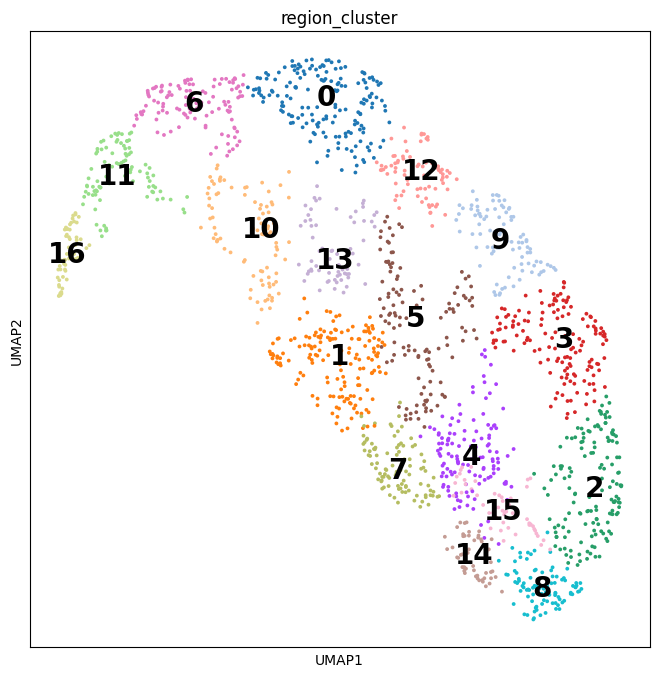

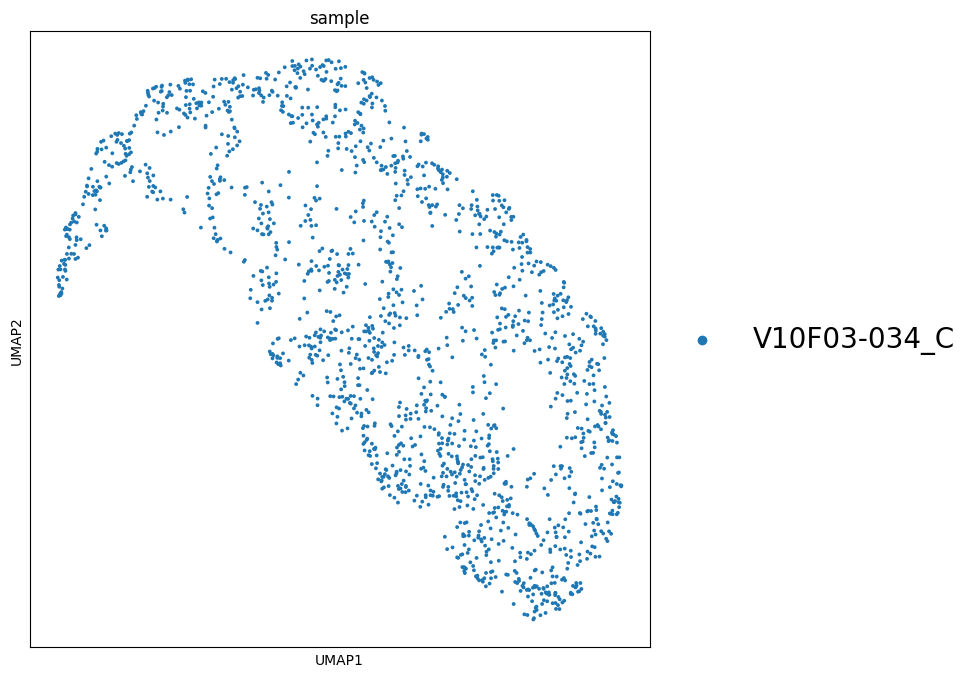

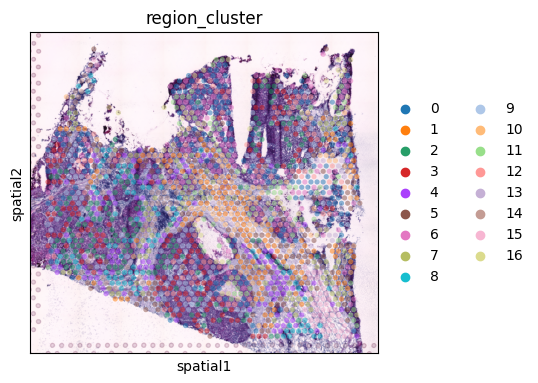

In [67]:
# compute UMAP using KNN graph based on the cell2location output
sc.tl.umap(adata_vis, min_dist = 0.3, spread = 1)

# show regions in UMAP coordinates
with mpl.rc_context({'axes.facecolor':  'white',
                     'figure.figsize': [8, 8]}):
    sc.pl.umap(adata_vis, color=['region_cluster'], size=30,
               color_map = 'RdPu', ncols = 2, legend_loc='on data',
               legend_fontsize=20)
    sc.pl.umap(adata_vis, color=['sample'], size=30,
               color_map = 'RdPu', ncols = 2,
               legend_fontsize=20)

# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):
    sc.pl.spatial(adata_vis, color=['region_cluster'],
                  size=1.3, img_key='hires', alpha=0.5)

### Identifying cellular compartments / tissue zones using matrix factorisation (NMF)

In [68]:
from cell2location import run_colocation
res_dict, adata_vis = run_colocation(
    adata_vis,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(11, 13), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    # the hyperparameters of NMF can be also adjusted:
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.000001}},
    export_args={'path': f'{run_name}/CoLocatedComb/'}
)

### Analysis name: CoLocatedGroupsSklearnNMF_11combinations_1762locations_9factors


/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


### Analysis name: CoLocatedGroupsSklearnNMF_12combinations_1762locations_9factors


/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


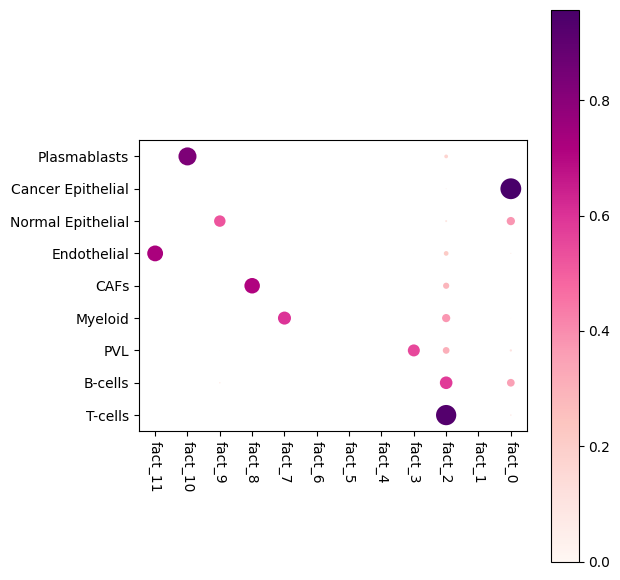

In [69]:
# Here we plot the NMF weights (Same as saved to `cell_type_fractions_heatmap`)
res_dict['n_fact12']['mod'].plot_cell_type_loadings()

### Get rid of the multiple assignment problem (selecting maximum cell type idea)

The above cell shows that some portion of the spots have multiple cell types assigned to them, because multiple cell types have values above the threshold. However, the re-assignment idea requires a single cell type assigned to a spot, or none at all, so that the success of the model can be calculated by comparing to pathologist annotations (ground truth). In order to overcome this issue, we can try the following approach: For spots with no assignment, leave as blank. For spots with a single assignment, assign that cell type. For spots with multiple assignments, check the estimation values for cell types in the multiple assignment, and select the cell type with maximum estimation value as the final assignment.

In [70]:
# function to find the dominant cell type and its score
def find_max_assigned_and_score(row):
    assigned_cell_types = []
    
    for col in slide.obs.columns:
        if col.startswith('Assign ') and row[col] == True:
            cell_type = col.replace('Assign ', '').replace('?', '')
            assigned_cell_types.append(cell_type)
    
    if not assigned_cell_types:
        return pd.Series(["No Assignment", 0])
    
    # dominant cell type and its score
    max_cell_type = max(assigned_cell_types, key=lambda ct: row[ct])
    max_score = row[max_cell_type]
    
    return pd.Series([max_cell_type, max_score])

slide.obs[['c2l_prediction', 'c2l_score']] = slide.obs.apply(find_max_assigned_and_score, axis=1)

# create dataframe
dominant_df = slide.obs[['c2l_prediction', 'c2l_score']].copy()
dominant_df['spot_id'] = dominant_df.index
dominant_df = dominant_df[['spot_id', 'c2l_prediction', 'c2l_score']]

# save
dominant_df.to_csv("cell2location_predictions.csv", index=False)


In [71]:
# function to find the cell type with the maximum value
def find_max_assigned(row):
    assigned_cell_types = []
    
    # loop over the columns to identify which cell types have True values
    for col in slide.obs.columns:
        if col.startswith('Assign ') and row[col] == True:
            cell_type = col.replace('Assign ', '').replace('?', '')
            assigned_cell_types.append(cell_type)
    
    # if no assignment
    if not assigned_cell_types:
        return "No Assignment"
    
    # find max cell type
    max_cell_type = max(assigned_cell_types, key=lambda ct: row[ct])
    return max_cell_type

# apply the function
slide.obs['Assigned Cell Type'] = slide.obs.apply(find_max_assigned, axis=1)

In [72]:
# Get Assigned Cell Type column and spot names
dominant_df = slide.obs[['Assigned Cell Type']].copy()

# If spot names are indexes, move them to a column
dominant_df['spot'] = dominant_df.index

# Set column sort to spot + Assigned Cell Type
dominant_df = dominant_df[['spot', 'Assigned Cell Type']]

# save as csv
dominant_df.to_csv("cell2location_dominant_assignment.csv", index=False)

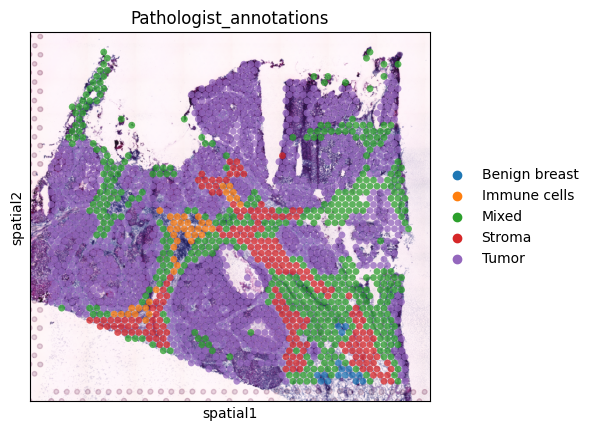

In [73]:
# pathologist annotation of the used sample
sc.pl.spatial(adata_vis, img_key="hires", color="Pathologist_annotations", size=1.5, alpha=0.75)

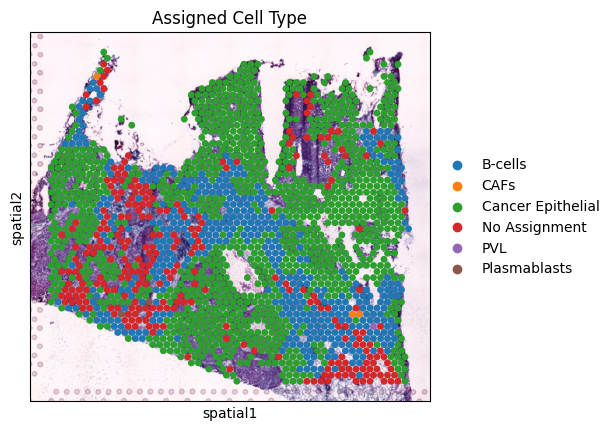

In [74]:
# Create the spatial plot with the custom palette
sc.pl.spatial(slide, img_key="hires", color="Assigned Cell Type", size=1.5, alpha=1)

### Get rid of the multiple assignment problem (max 3 cell types idea)

The above cell shows that some portion of the spots have multiple cell types assigned to them, because multiple cell types have values above the threshold. However, in order to compare the assignment results to the ground truth of pathologist annotation for the assessment of the success of the model, the spots with multiple assignments needs to be dealt with. For this purpose, the followings cells check the different combinations of cell types, and assigns the maximum 3 cell types with the highest estimation values (among those above the threshold).

In [75]:
# get the columns that has assignment results
assign_columns = [col for col in slide.obs.columns if col.startswith('Assign') and col.endswith('?')]

# function for getting the top three (or less) cell types above the threshold
def top_3_cell_types_alphabetical(row):
    true_cell_types = [col.replace('Assign ', '').replace('?', '') for col in assign_columns if row[col]]
    cell_type_estimations = {cell_type: row[cell_type] for cell_type in true_cell_types}
    top_3 = sorted(cell_type_estimations, key=cell_type_estimations.get, reverse=True)[:3]
    
    # Sort the selected top 3 cell types alphabetically
    top_3_sorted = sorted(top_3)
    return ', '.join(top_3_sorted)

# store assigned cell types in a comma-separated string
slide.obs['Assigned Cell Types'] = slide.obs.apply(top_3_cell_types_alphabetical, axis=1)
slide.obs['Assigned Cell Types'].unique()

array(['Cancer Epithelial',
       'B-cells, Cancer Epithelial, Normal Epithelial', 'B-cells', '',
       'B-cells, Cancer Epithelial',
       'B-cells, Cancer Epithelial, T-cells',
       'Cancer Epithelial, Normal Epithelial',
       'B-cells, CAFs, Cancer Epithelial', 'PVL',
       'B-cells, Cancer Epithelial, Myeloid', 'CAFs', 'Plasmablasts',
       'B-cells, CAFs', 'B-cells, Myeloid'], dtype=object)

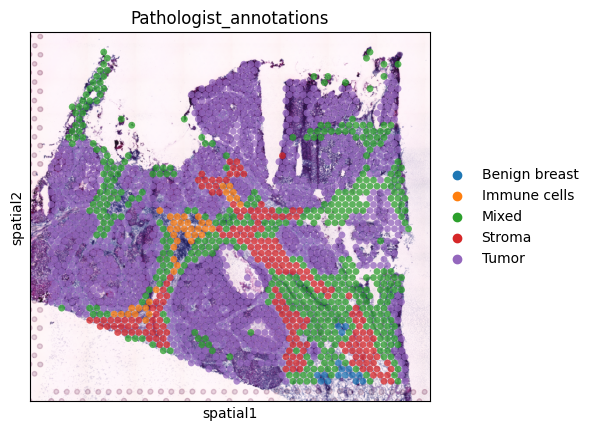

In [76]:
# pathologist annotation of the used sample
sc.pl.spatial(adata_vis, img_key="hires", color="Pathologist_annotations", size=1.5, alpha=0.75)

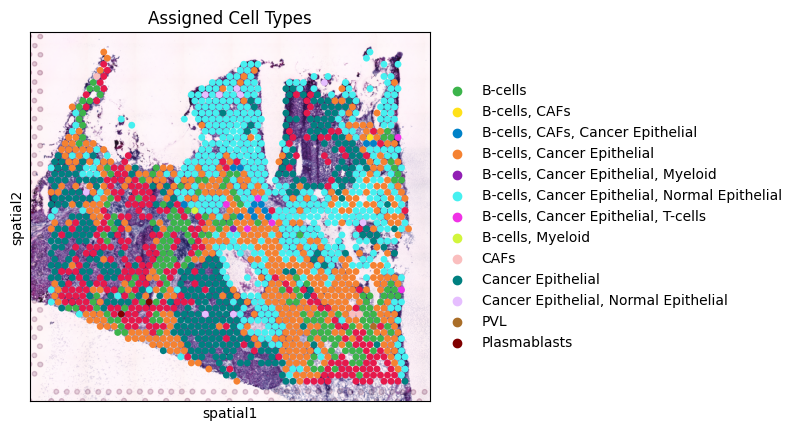

In [77]:
# visualise reannotation of the used sample
custom_palette = [
    "#e6194b",  # Bright Red
    "#3cb44b",  # Bright Green
    "#ffe119",  # Yellow
    "#0082c8",  # Strong Blue
    "#f58231",  # Orange
    "#911eb4",  # Purple
    "#46f0f0",  # Cyan
    "#f032e6",  # Magenta
    "#d2f53c",  # Lime
    "#fabebe",  # Pink
    "#008080",  # Teal
    "#e6beff",  # Lavender
    "#aa6e28",  # Brown
    "#800000",  # Maroon
    "#bcbd22"   # Olive
]

# Create the spatial plot with the custom palette
sc.pl.spatial(slide, img_key="hires", color="Assigned Cell Types", size=1.5, alpha=1, palette=custom_palette)

The resulting clusters does not seem to be making too much biological sense. One could classify "B cells, T cells" cluster as "Immune cells" but it is most of the clusters do not have a correspondance such as that. For example, the most common clusters are "B cells, Cancer Epithelial" and "B cells, Cancer Epithelial, Normal Epithelial" but there is no way of finding a correspondance to these clusters with a high confidence. Therefore, this approach does not seem to be successful.

### Get rid of the multiple assignment problem (selecting dominant cell type idea)

The above cell shows that some portion of the spots have multiple cell types assigned to them, because multiple cell types have values above the threshold. However, in order to compare the assignment results to the ground truth of pathologist annotation for the assessment of the success of the model, the spots with multiple assignments needs to be dealt with. For this purpose, the followings cells check the different combinations of cell types, and assigns the maximum 3 cell types with the highest estimation values (among those above the threshold). After that selection, the dominant cell type is selected as follows:

For combinations of two cell types, the one with percentage 60% or above of the total of the top 2 is the dominant one.

For combinations of three cell type, the one with percentage 40 (or 45)% or above of the total of the top 3 is the dominant one.

If a spot has multiple assignments but there is no dominant cell type according to above thresholds, no assignment is done.

In [78]:
# get the columns that has assignment results
assign_columns = [col for col in slide.obs.columns if col.startswith('Assign') and col.endswith('?')]

dominant_cell_types = []
for index, row in slide.obs.iterrows():
    # get assigned cell types and their estimations
    true_cell_types = [col.replace('Assign ', '').replace('?', '') for col in assign_columns if row[col]]
    cell_type_estimations = {cell_type: row[cell_type] for cell_type in true_cell_types}

    # if no assignment was done
    if len(true_cell_types) == 0:
        dominant_cell_types.append("No Assignment")
    else:
        # sorting the assigned estimations
        sorted_cell_type_estimations = dict(sorted(cell_type_estimations.items(), key=lambda item: item[1], reverse=True))
        top_cell_types = list(sorted_cell_type_estimations.keys())[:3]
        top_estimations = list(sorted_cell_type_estimations.values())[:3]

        # only a single assignment
        if len(top_cell_types) == 1:
            dominant_cell_types.append(top_cell_types[0])
        # if two assignments
        elif len(top_cell_types) == 2:
            threshold = 0.6
            # one is dominant to the other
            if top_estimations[0] >= threshold * sum(top_estimations):
                dominant_cell_types.append(top_cell_types[0])
            # no dominant cell type
            else:
                dominant_cell_types.append("No Assignment")
        # if three assignments
        elif len(top_cell_types) == 3:
            threshold = 0.4
            # one is dominant to the other two
            if top_estimations[0] >= threshold * sum(top_estimations):
                dominant_cell_types.append(top_cell_types[0])
            # no dominant cell type
            else:
                dominant_cell_types.append("No Assignment") 

# Add the dominant cell types to the AnnData object
slide.obs['Assigned Cell Type'] = dominant_cell_types

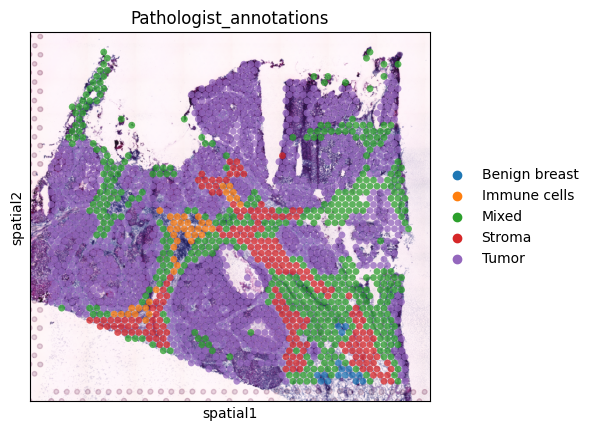

In [79]:
# pathologist annotation of the used sample
sc.pl.spatial(adata_vis, img_key="hires", color="Pathologist_annotations", size=1.5, alpha=0.75)

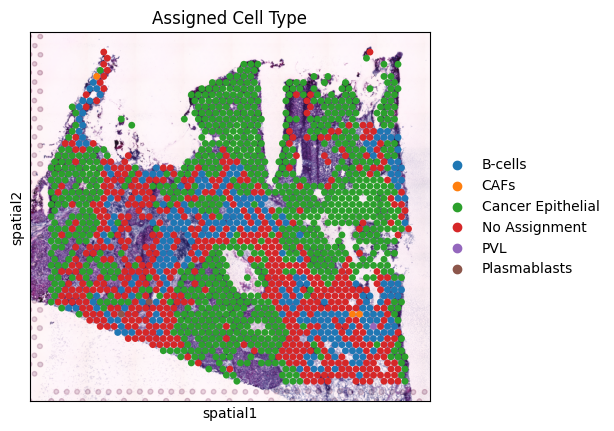

In [80]:
# Create the spatial plot with the custom palette
sc.pl.spatial(slide, img_key="hires", color="Assigned Cell Type", size=1.5, alpha=1)

### Save the assignment results

In [81]:
slide_name = "V10F03-034_C"
slide.write(os.path.join(results_folder +"/estimations", slide_name + ".h5ad"))

### Measure classification metrices

In order to assess the classification of the model, classification matrices are calculated.

#### Prepare slide.obs dataframe

The cell types coming from the scRNAseq library are mapped to their corresponding pathologist annotations. 

Note: The complexity of tumor environments allows some cell types to be assigned to multiple annotations. 

For example, myeloid cells are immune cells that can also be present in stroma regions, therefore they are allowed to be mapped to "Stroma" or "Immune Cells" annotations of the pathologist annotations.


Cell type --> Pathologist annotation 

Cancer Epithelial, CAFs --> Tumor 

Normal Epithelial --> Benign BreastCAFs, 

Endothelial, Myeloid, PVL --> StromaB-cells,
 
T-cells, Myeloid, Plasmablasts --> Immune cells

In [82]:
mapping = {
    'Cancer Epithelial': ['Tumor'],
    'CAFs': ['Tumor', 'Stroma'],
    'Normal Epithelial': ['Benign breast'],
    'Endothelial': ['Stroma'],
    'Myeloid': ['Stroma', 'Immune cells'],
    'B-cells': ['Immune cells'],
    'T-cells': ['Immune cells'],
    'Plasmablasts': ['Immune cells'],
    'PVL': ['Stroma'],
}

Note: The scRNAseq library does not include any cell types that can be classified as "Fat" , which is present in pathologist annotations. Therefore, since the model cannot make predictions for these spots, they are excluded from calculations (if present). 


Note: The pathologist annotation "Out" stands for spots with technical issues (such as bad staining etc.). Therefore, these are excluded from calculations as well (if present).


Note: The pathologist annotation "Mixed" stands for spots that were not able to be annotated with a confidence. Since we do not have any ground truth for these, they are excluded from calculations as well.

In [83]:
obs_df = slide.obs
mask = ~obs_df['Pathologist_annotations'].isin(['Fat', 'Out', 'Mixed'])
filtered_slide = slide[mask].copy()
filtered_slide.obs

,in_tissue,array_row,array_col,sample,Pathologist_annotations,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,...,Assign T-cells?,Assign Myeloid?,Assign Cancer Epithelial?,Assign Plasmablasts?,Assign Normal Epithelial?,Assignment Count,c2l_prediction,c2l_score,Assigned Cell Type,Assigned Cell Types
spot_id,,,,,,,,,,,,,,,,,,,,,
V10F03-034_C_AAACACCAATAACTGC-1,1,59,19,V10F03-034_C,Tumor,447,562.0,11.0,1.957295,56.0,...,False,False,True,False,False,1,Cancer Epithelial,3.088629,Cancer Epithelial,Cancer Epithelial
V10F03-034_C_AAACAGCTTTCAGAAG-1,1,43,9,V10F03-034_C,Tumor,711,980.0,22.0,2.244898,140.0,...,False,False,True,False,True,3,Cancer Epithelial,11.359142,Cancer Epithelial,"B-cells, Cancer Epithelial, Normal Epithelial"
V10F03-034_C_AAACAGTGTTCCTGGG-1,1,73,43,V10F03-034_C,Tumor,306,352.0,17.0,4.829545,34.0,...,False,False,True,False,False,1,Cancer Epithelial,4.361568,Cancer Epithelial,Cancer Epithelial
V10F03-034_C_AAACATGGTGAGAGGA-1,1,62,0,V10F03-034_C,Tumor,1229,1770.0,19.0,1.073446,170.0,...,False,False,True,False,True,3,Cancer Epithelial,14.402946,Cancer Epithelial,"B-cells, Cancer Epithelial, Normal Epithelial"
V10F03-034_C_AAACCGTTCGTCCAGG-1,1,52,42,V10F03-034_C,Immune cells,277,317.0,6.0,1.892745,26.0,...,False,False,False,False,False,0,No Assignment,0.000000,No Assignment,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V10F03-034_C_TTGTGTATGCCACCAA-1,1,56,60,V10F03-034_C,Stroma,791,1181.0,39.0,3.302286,206.0,...,False,False,True,False,True,3,Cancer Epithelial,7.370894,Cancer Epithelial,"B-cells, Cancer Epithelial, Normal Epithelial"
V10F03-034_C_TTGTGTTTCCCGAAAG-1,1,51,59,V10F03-034_C,Stroma,721,1269.0,35.0,2.758077,153.0,...,False,False,False,False,False,1,B-cells,4.224864,B-cells,B-cells
V10F03-034_C_TTGTTGTGTGTCAAGA-1,1,31,77,V10F03-034_C,Tumor,338,383.0,12.0,3.133159,31.0,...,False,False,True,False,False,1,Cancer Epithelial,3.994397,Cancer Epithelial,Cancer Epithelial


## Calculate TP, FP, FN, TN for each assignment

In order to calculate metrices (like F1 score, accuracy, precision etc.), the counts of True Positive (TP), False Positive (FP), False Negative (FN), True Negative (TN) data points need to be calculated for each pathologist annotation. Since the model can not assign an annotation to each data point (noted as 'No Assignment' in 'Assigned Cell Type' column), and the cell type to pathologist annotation mapping is not mutually exclusive for some annotations, the built-in Python packages is not used directly. Instead, each score is calculated manually for each pathologist annotation as follows:

True Positive (TP): If a spot is predicted as a cell type that maps to the annotation of interest, and it matches the true annotation; and it is not left with "No Assignment".


False Positive (FP): If a spot is predicted as a cell type that maps to the annotation of interest, but it does not match the true annotation; and it is not left with "No Assignment".


False Negative (FN): If a spot is predicted as a cell type that does not map to the annotation of interest or it is left with "No Assignment", but the true annotation is the annotation of interest.


True Negative (TN): If a spot is predicted as a cell type that does not map to the annotation of interest or it is left with "No Assignment", and the true annotation is not the annotation of interest.

In [84]:
# dictionary to store scores
scores = {"Tumor": {"TP": 0, "FP": 0, "FN": 0, "TN": 0}, 
          "Benign breast": {"TP": 0, "FP": 0, "FN": 0, "TN": 0},
          "Immune cells": {"TP": 0, "FP": 0, "FN": 0, "TN": 0},
          "Stroma": {"TP": 0, "FP": 0, "FN": 0, "TN": 0}}

In [85]:
# iterate over slide.obs for each annotation
for index, row in filtered_slide.obs.iterrows():
    true = row["Pathologist_annotations"]
    pred = row["Assigned Cell Type"]
    for annotation in scores.keys(): # iterate over annotations
        if pred == "No Assignment" or annotation not in mapping[pred]: # prediction was "No assignment" or it doesn't map to the annotation of interest
            if true == annotation: # false negative
                scores[annotation]["FN"] += 1
            else: # true negative
                scores[annotation]["TN"] += 1
        else: # prediction maps to the annotation of interest
            if true == annotation: # true positive
                scores[annotation]["TP"] += 1
            else: # false positive
                scores[annotation]["FP"] += 1

scores

{'Tumor': {'TP': 767, 'FP': 20, 'FN': 232, 'TN': 246},
 'Benign breast': {'TP': 0, 'FP': 0, 'FN': 16, 'TN': 1249},
 'Immune cells': {'TP': 20, 'FP': 94, 'FN': 25, 'TN': 1126},
 'Stroma': {'TP': 2, 'FP': 0, 'FN': 203, 'TN': 1060}}

### Calculate the table of metrices

In [86]:
metrics = []

# calculate the metrics for each category
for category, values in scores.items():
    TP = values['TP']
    FP = values['FP']
    FN = values['FN']
    TN = values['TN']
    
    # calculations
    accuracy = (TP + TN) / (TP + TN + FP + FN)
    precision = TP / (TP + FP) if (TP + FP) != 0 else np.nan
    recall = TP / (TP + FN) if (TP + FN) != 0 else np.nan
    specificity = TN / (TN + FP) if (TN + FP) != 0 else np.nan
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) != 0 else np.nan
    fpr = FP / (FP + TN) if (FP + TN) != 0 else np.nan
    fnr = FN / (FN + TP) if (FN + TP) != 0 else np.nan
    npv = TN / (TN + FN) if (TN + FN) != 0 else np.nan

    # save results
    metrics.append({
        'Category': category,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'Specificity': specificity,
        'F1-Score': f1_score,
        'FPR': fpr,
        'FNR': fnr,
        'NPV': npv
    })

# Convert the list to a DataFrame
metrics_df = pd.DataFrame(metrics)
metrics_df

metrics_df.to_csv("cell2location_metrics.csv", index=False)

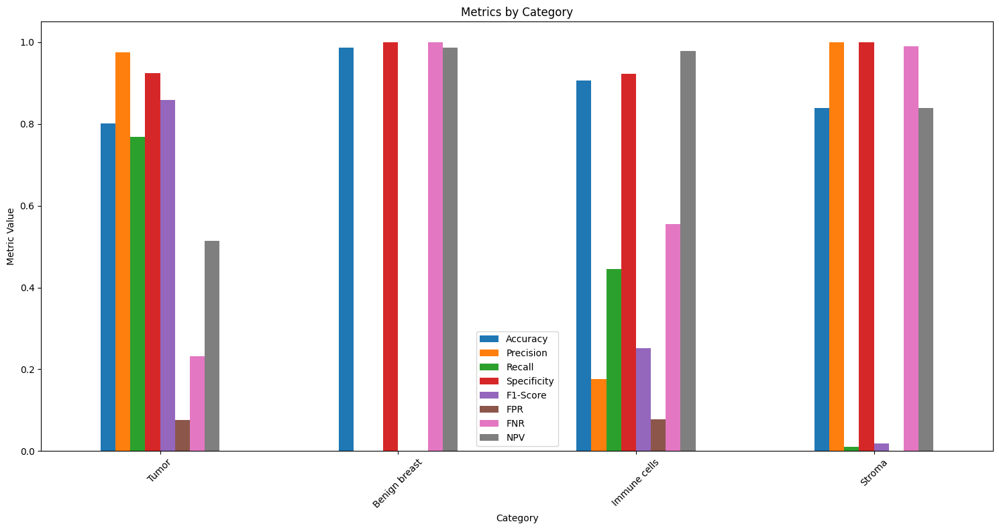

In [87]:
# visualisation
metrics_df.set_index('Category', inplace=True)
metrics_df.plot(kind='bar', figsize=(15, 8))
plt.title('Metrics by Category')
plt.ylabel('Metric Value')
plt.xlabel('Category')
plt.xticks(rotation=45)
plt.legend(loc='best')
plt.tight_layout()
plt.show()